# Gunjan Chakraborty

## 22MSRDS007

In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
# Load the dataset
df = pd.read_csv('D:/Chools/Day_10/diabetes.csv')

### 1. Exploratory Data Analysis (EDA):

In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB
None


In [4]:
print(df.describe())

       Pregnancies     Glucose  BloodPressure  SkinThickness     Insulin  \
count   768.000000  768.000000     768.000000     768.000000  768.000000   
mean      3.845052  120.894531      69.105469      20.536458   79.799479   
std       3.369578   31.972618      19.355807      15.952218  115.244002   
min       0.000000    0.000000       0.000000       0.000000    0.000000   
25%       1.000000   99.000000      62.000000       0.000000    0.000000   
50%       3.000000  117.000000      72.000000      23.000000   30.500000   
75%       6.000000  140.250000      80.000000      32.000000  127.250000   
max      17.000000  199.000000     122.000000      99.000000  846.000000   

              BMI  DiabetesPedigreeFunction         Age     Outcome  
count  768.000000                768.000000  768.000000  768.000000  
mean    31.992578                  0.471876   33.240885    0.348958  
std      7.884160                  0.331329   11.760232    0.476951  
min      0.000000                  

In [5]:
print(df.isnull().sum())

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64


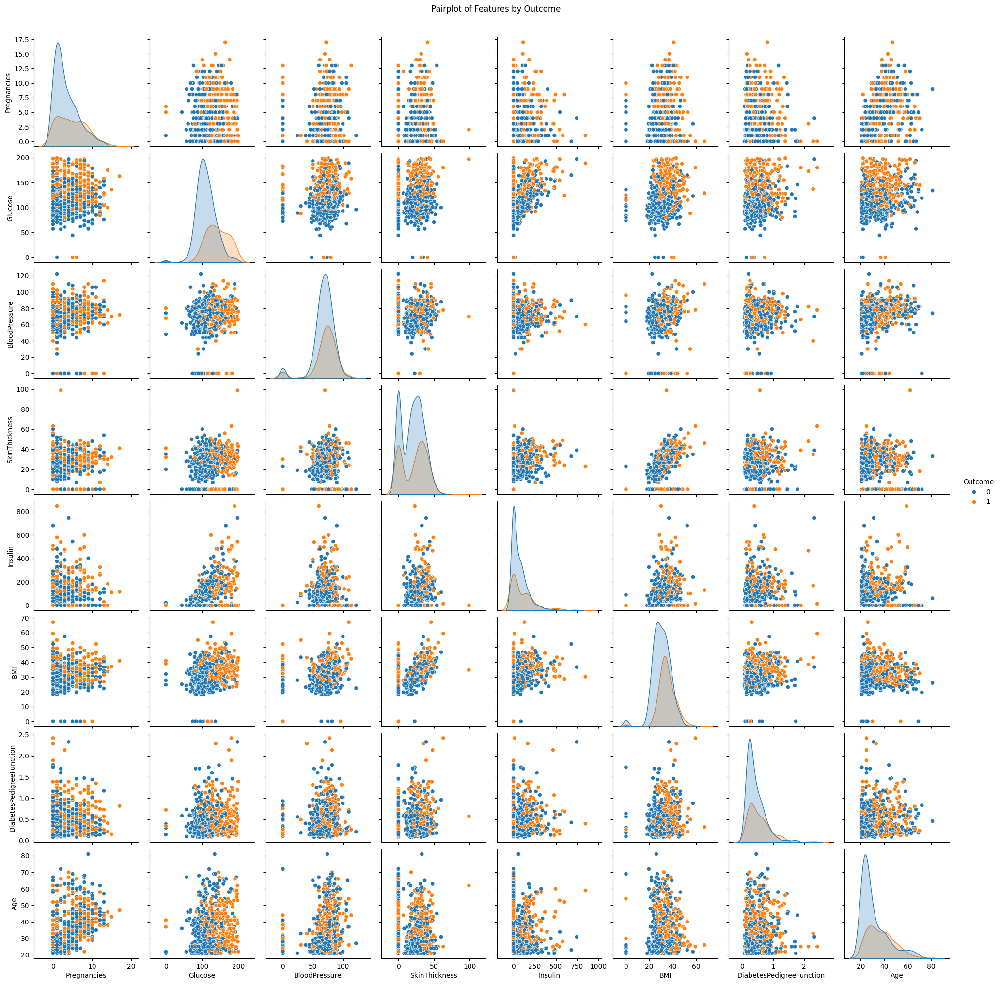

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.pairplot(df, hue='Outcome', diag_kind='kde')
plt.suptitle('Pairplot of Features by Outcome', y=1.02)
plt.show()

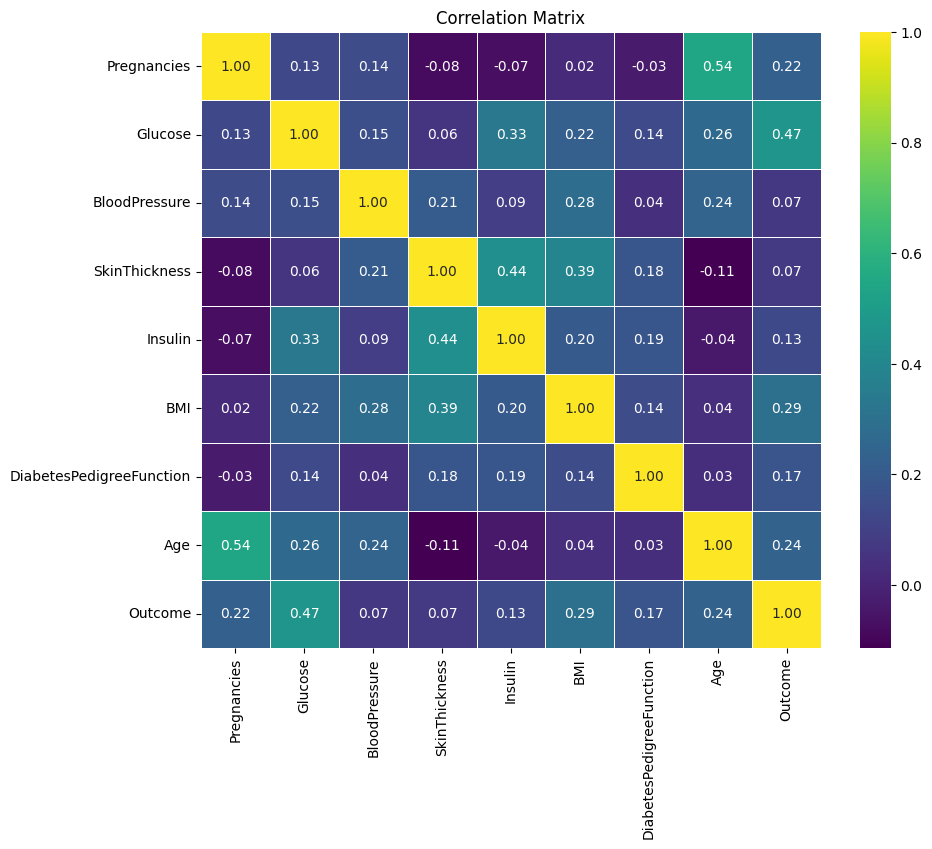

In [7]:
# Correlation matrix heatmap
correlation_matrix = df.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

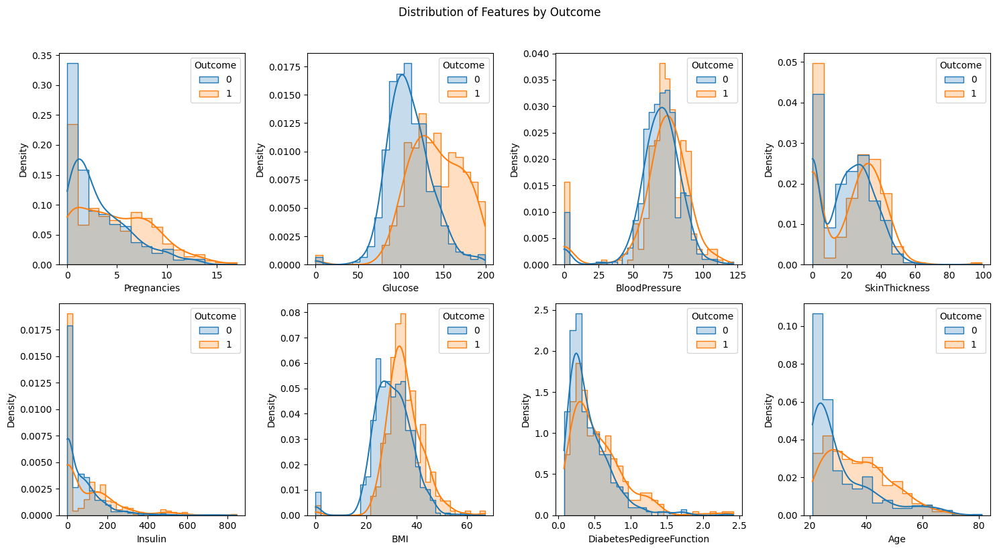

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Distribution of each feature by Outcome with a unified histogram
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8))
fig.suptitle('Distribution of Features by Outcome', y=1.02)

for i, column in enumerate(df.columns[:-1]):
    sns.histplot(data=df, x=column, hue='Outcome', kde=True, element="step", stat="density", common_norm=False, ax=axes[i // 4, i % 4])

plt.tight_layout()
plt.show()

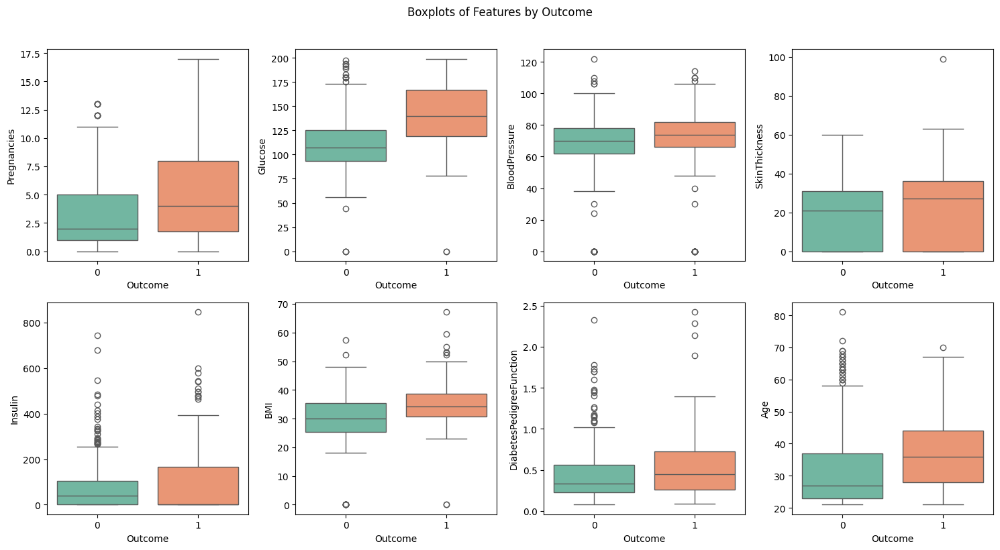

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define a colorful palette
colors = ["#66c2a5", "#fc8d62"]

# Boxplots for each feature by Outcome
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8))
fig.suptitle('Boxplots of Features by Outcome', y=1.02)

for i, column in enumerate(df.columns[:-1]):
    sns.boxplot(data=df, x='Outcome', y=column, ax=axes[i // 4, i % 4], palette=colors)

plt.tight_layout()
plt.show()


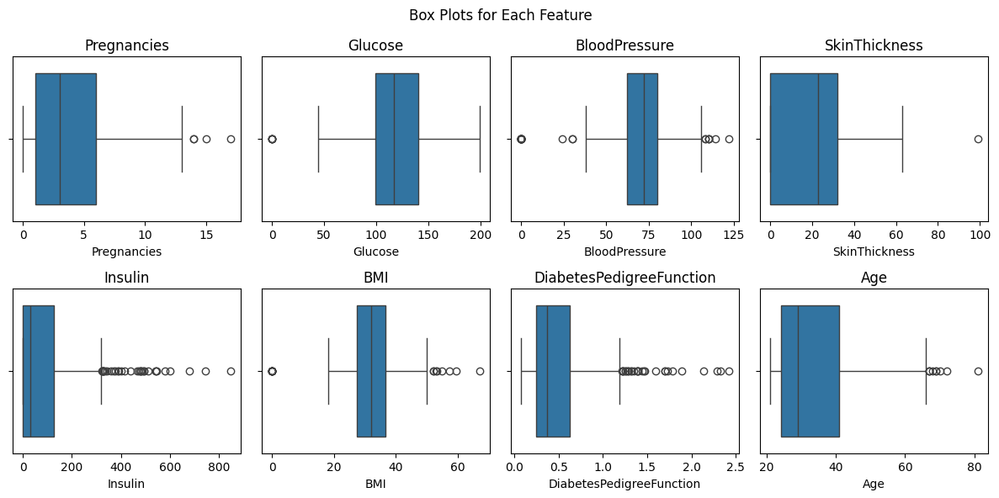

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select columns excluding 'Outcome'
columns_to_plot = df.iloc[:, :-1]

# Create subplots
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 6))
fig.suptitle('Box Plots for Each Feature')

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Create box plots for each column
for i, column in enumerate(columns_to_plot.columns):
    sns.boxplot(x=columns_to_plot[column], ax=axes[i])
    axes[i].set_title(column)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

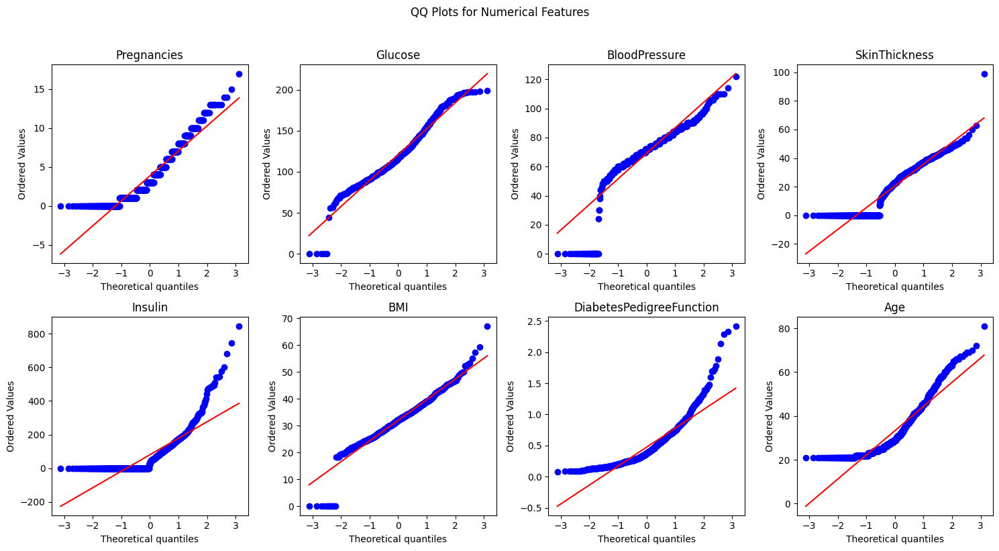

In [11]:
# Q-Q plot
import statsmodels.api as sm
from scipy.stats import probplot

# QQ plot for each numerical feature
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8))
fig.suptitle('QQ Plots for Numerical Features', y=1.02)

for i, column in enumerate(df.columns[:-1]):
    probplot(df[column], plot=axes[i // 4, i % 4])
    axes[i // 4, i % 4].set_title(column)

plt.tight_layout()
plt.show()

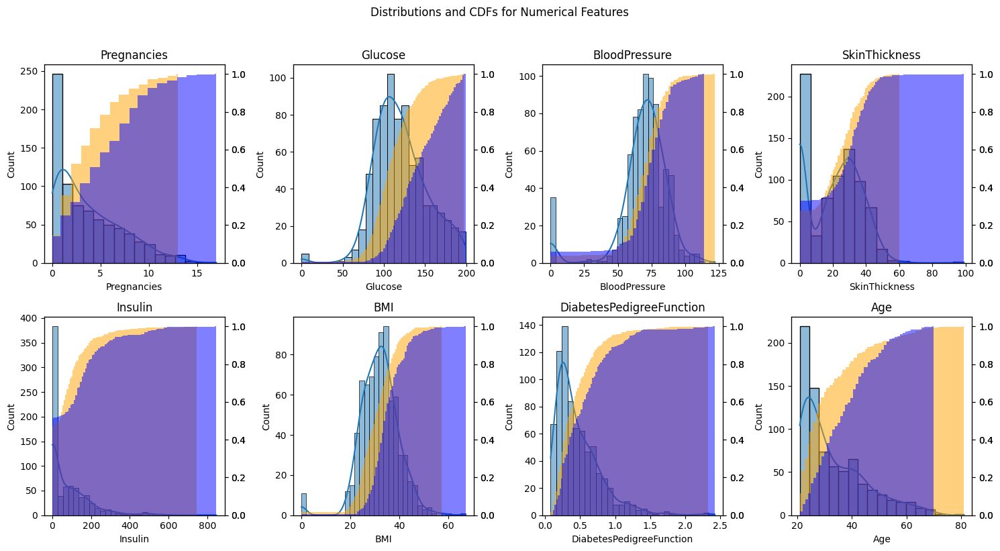

In [12]:
# Individual feature distributions and CDFs
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(15, 8))
fig.suptitle('Distributions and CDFs for Numerical Features', y=1.02)

for i, column in enumerate(df.columns[:-1]):
    sns.histplot(data=df, x=column, kde=True, ax=axes[i // 4, i % 4])
    axes[i // 4, i % 4].set_title(column)
    axes[i // 4, i % 4].twinx().hist(df[df['Outcome'] == 0][column], cumulative=True, bins=100, color='orange', alpha=0.5, density=True)
    axes[i // 4, i % 4].twinx().hist(df[df['Outcome'] == 1][column], cumulative=True, bins=100, color='blue', alpha=0.5, density=True)

plt.tight_layout()
plt.show()

In [13]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming X contains the predictor variables
VIF = df.drop('Outcome', axis=1)

# Calculate VIF for each predictor variable
vif_data = pd.DataFrame()
vif_data["Variable"] = VIF.columns
vif_data["VIF"] = [variance_inflation_factor(VIF.values, i) for i in range(VIF.shape[1])]

# Display the VIF values
print(vif_data)

                   Variable        VIF
0               Pregnancies   3.275748
1                   Glucose  16.725078
2             BloodPressure  14.619512
3             SkinThickness   4.008696
4                   Insulin   2.063689
5                       BMI  18.408884
6  DiabetesPedigreeFunction   3.195626
7                       Age  13.492985


## Interpretation

1. **Glucose (VIF = 16.72):**
   - A VIF of 16.72 for 'Glucose' suggests a high level of multicollinearity with other variables in the dataset. This may indicate that 'Glucose' has a strong correlation with other predictor variables, potentially affecting the stability and reliability of the regression model.

2. **BloodPressure (VIF = 14.61):**
   - Similar to 'Glucose', a VIF of 14.61 for 'BloodPressure' indicates a high level of multicollinearity. This variable seems to have a strong correlation with other predictors.

3. **BMI (VIF = 18.40):**
   - 'BMI' has a very high VIF, suggesting a substantial degree of multicollinearity with other variables. This should be carefully considered, as it may affect the interpretation of the regression coefficients.

4. **Age (VIF = 13.49):**
   - 'Age' also has a high VIF, indicating multicollinearity. The presence of strong correlations between 'Age' and other predictors may impact the reliability of the regression model.

Variables with VIF values above a certain threshold (commonly 5-10) are considered to have problematic levels of multicollinearity. In this case, 'Glucose,' 'BloodPressure,' 'BMI,' and 'Age' exhibit high VIF values, suggesting potential issues.

To address multicollinearity, we may consider:
- Removing one of the highly correlated variables.
- Combining correlated variables into a composite feature.
- Applying regularization techniques (e.g., Ridge or Lasso regression) that automatically penalize the influence of highly correlated predictors.


In [14]:
import numpy as np

# Calculate Z-scores for each column
z_scores = np.abs((df - df.mean()) / df.std())

# Define a threshold for outliers (e.g., Z-score greater than 3)
outlier_threshold = 3

# Identify outliers for each column
outliers = (z_scores > outlier_threshold).sum()

# Display the count of outliers for each column
print("Number of outliers for each column:")
print(outliers)

Number of outliers for each column:
Pregnancies                  4
Glucose                      5
BloodPressure               35
SkinThickness                1
Insulin                     18
BMI                         14
DiabetesPedigreeFunction    11
Age                          5
Outcome                      0
dtype: int64


In [15]:
# Remove outliers using z-score or IQR method
from scipy.stats import zscore

z_scores = zscore(df)
df_no_outliers = df[(z_scores < 3).all(axis=1)]


In [16]:
df_no_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 729 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               729 non-null    int64  
 1   Glucose                   729 non-null    int64  
 2   BloodPressure             729 non-null    int64  
 3   SkinThickness             729 non-null    int64  
 4   Insulin                   729 non-null    int64  
 5   BMI                       729 non-null    float64
 6   DiabetesPedigreeFunction  729 non-null    float64
 7   Age                       729 non-null    int64  
 8   Outcome                   729 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 57.0 KB


### 3. Model Fitting:

In [21]:
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

In [22]:
# Separate features and target variable
X = df.drop('Outcome', axis=1)
y = df['Outcome']

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [23]:
# XGBoost
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)

# Predictions
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate accuracy
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("XGBoost Accuracy:", accuracy_xgb)


XGBoost Accuracy: 0.7077922077922078


In [27]:
# LightGBM
lgbm_model = LGBMClassifier()
lgbm_model.fit(X_train, y_train)

# Predictions
y_pred_lgbm = lgbm_model.predict(X_test)

# Evaluate accuracy
accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)
print("LightGBM Accuracy:", accuracy_lgbm)

[LightGBM] [Info] Number of positive: 213, number of negative: 401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000066 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.346906 -> initscore=-0.632669
[LightGBM] [Info] Start training from score -0.632669
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [33]:
# LightGBM with adjusted parameters
lgbm_model = LGBMClassifier(
    num_leaves=20,      
    max_depth=-1,       
    learning_rate=0.1,  
    n_estimators=100,   
    min_child_samples=20, 
)

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")

# Train the model
lgbm_model.fit(X_train, y_train)

# Predictions
y_pred_lgbm = lgbm_model.predict(X_test)

# Evaluate accuracy
accuracy_lgbm = accuracy_score(y_test, y_pred_lgbm)
print("LightGBM Accuracy:", accuracy_lgbm)

[LightGBM] [Info] Number of positive: 213, number of negative: 401
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000073 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 664
[LightGBM] [Info] Number of data points in the train set: 614, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.346906 -> initscore=-0.632669
[LightGBM] [Info] Start training from score -0.632669
LightGBM Accuracy: 0.7207792207792207


In [34]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score


# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for grid search
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'min_child_weight': [1, 5, 10],
    'gamma': [0, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
}

# Initialize XGBClassifier
xgb_model = XGBClassifier()

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best parameters and best accuracy
print("Best parameters found:", grid_search.best_params_)
print("Best accuracy found:", grid_search.best_score_)

# Evaluate the model with best parameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on test set with best model:", accuracy)

Best parameters found: {'colsample_bytree': 1.0, 'gamma': 0, 'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 50, 'subsample': 0.8}
Best accuracy found: 0.7866986538717847
Accuracy on test set with best model: 0.7532467532467533


In [35]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score

# Split data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define parameter grid for grid search
param_grid = {
    'num_leaves': [31, 50, 100],
    'max_depth': [-1, 3, 5],
    'learning_rate': [0.05, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'min_child_samples': [20, 50, 100]
}

# Initialize LGBMClassifier
lgbm_model = LGBMClassifier()

# Perform grid search with cross-validation
grid_search = GridSearchCV(estimator=lgbm_model, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best parameters and best accuracy
print("Best parameters found:", grid_search.best_params_)
print("Best accuracy found:", grid_search.best_score_)

# Evaluate the model with best parameters
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy on test set with best model:", accuracy)

[LightGBM] [Info] Number of positive: 171, number of negative: 320
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 578
[LightGBM] [Info] Number of data points in the train set: 491, number of used features: 8
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.348269 -> initscore=-0.626657
[LightGBM] [Info] Start training from score -0.626657
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 